# **Flip**

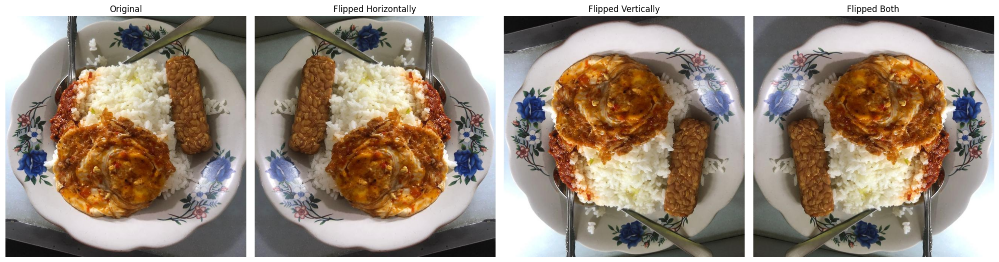

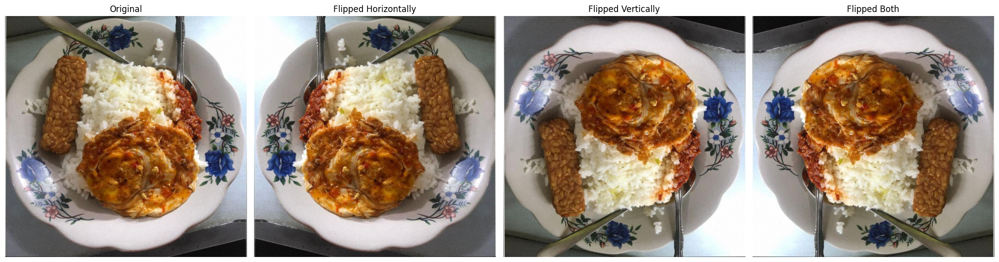

In [6]:
# Import necessary libraries
import os
import cv2
import matplotlib.pyplot as plt

# Define the directory path
directory = 'dataset/train/images'

# List all files in the directory
files = os.listdir(directory)

# Select the first 5 image paths from the directory
image_paths = [os.path.join(directory, file) for file in files[:2]]

# Define a function to load and plot original and flipped images
def plotFlippedImages(image_paths):
    for img_path in image_paths[:2]:  # Limit to 2 images
        # Load image using cv2
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB (opencv uses BGR by default)

        # Generate flipped versions of the image
        flipped_horizontally = cv2.flip(img, 1)  # Transformasi ini membalikkan citra secara horizontal dengan kemungkinan 50%.
        flipped_vertically = cv2.flip(img, 0)    # Flip vertically
        flipped_both = cv2.flip(img, -1)        # Flip both horizontally and vertically

        # Plot the original and flipped images
        fig, axes = plt.subplots(1, 4, figsize=(20, 10))
        
        axes[0].imshow(img)
        axes[0].set_title('Original')
        axes[0].axis('off')

        axes[1].imshow(flipped_horizontally)
        axes[1].set_title('Flipped Horizontally')
        axes[1].axis('off')

        axes[2].imshow(flipped_vertically)
        axes[2].set_title('Flipped Vertically')
        axes[2].axis('off')

        axes[3].imshow(flipped_both)
        axes[3].set_title('Flipped Both')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()

# Call the function to display original and flipped images
plotFlippedImages(image_paths)


Rotasi

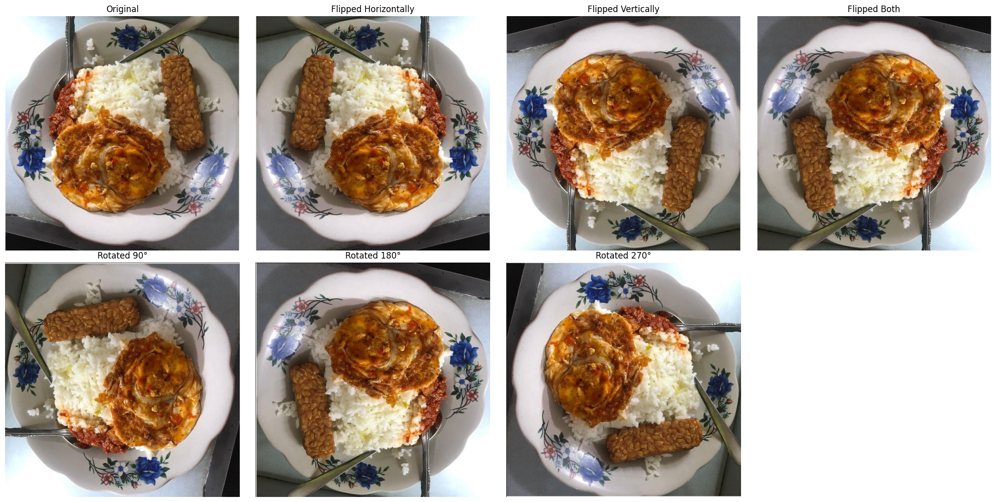

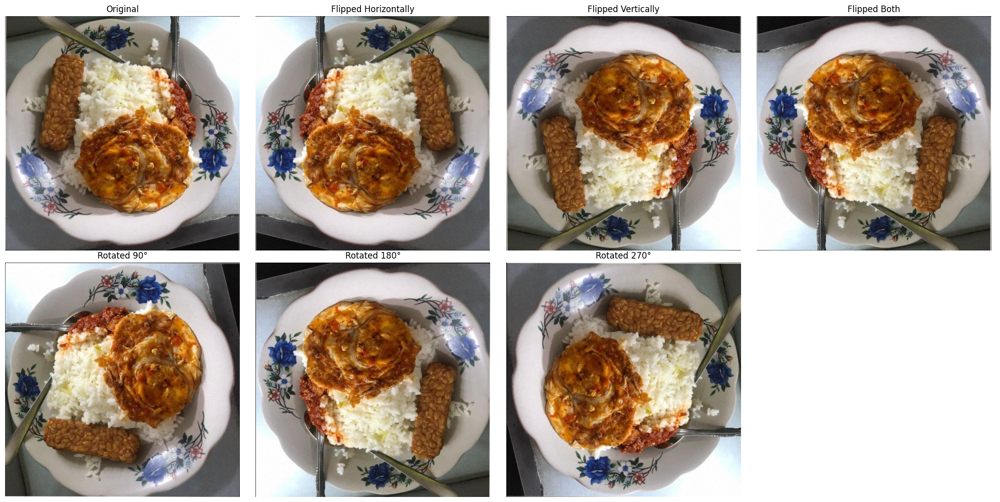

In [8]:
# Import necessary libraries
import os
import cv2
import matplotlib.pyplot as plt

# Define the directory path
directory = 'dataset/train/images'

# List all files in the directory
files = os.listdir(directory)

# Select the first 5 image paths from the directory
image_paths = [os.path.join(directory, file) for file in files[:6]]

# Define a function to load and plot original, flipped, and rotated images
def plotTransformedImages(image_paths):
    for img_path in image_paths[:2]:  # Limit to 2 images
        # Load image using cv2
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB (opencv uses BGR by default)

        # Generate flipped versions of the image
        flipped_horizontally = cv2.flip(img, 1)  # Transformasi ini membalikkan citra secara horizontal dengan kemungkinan 50%.
        flipped_vertically = cv2.flip(img, 0)    # Flip vertically
        flipped_both = cv2.flip(img, -1)        # Flip both horizontally and vertically

        # Generate rotated versions of the image
        height, width = img.shape[:2]
        center = (width // 2, height // 2)
        rotation_90 = cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 90, 1.0), (width, height))
        rotation_180 = cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 180, 1.0), (width, height))
        rotation_270 = cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 270, 1.0), (width, height))

        # Plot the original, flipped, and rotated images
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        
        # Original and flipped images
        axes[0][0].imshow(img)
        axes[0][0].set_title('Original')
        axes[0][0].axis('off')

        axes[0][1].imshow(flipped_horizontally)
        axes[0][1].set_title('Flipped Horizontally')
        axes[0][1].axis('off')

        axes[0][2].imshow(flipped_vertically)
        axes[0][2].set_title('Flipped Vertically')
        axes[0][2].axis('off')

        axes[0][3].imshow(flipped_both)
        axes[0][3].set_title('Flipped Both')
        axes[0][3].axis('off')

        # Rotated images
        axes[1][0].imshow(rotation_90)
        axes[1][0].set_title('Rotated 90°')
        axes[1][0].axis('off')

        axes[1][1].imshow(rotation_180)
        axes[1][1].set_title('Rotated 180°')
        axes[1][1].axis('off')

        axes[1][2].imshow(rotation_270)
        axes[1][2].set_title('Rotated 270°')
        axes[1][2].axis('off')

        axes[1][3].axis('off')  # Empty subplot for alignment

        plt.tight_layout()
        plt.show()

# Call the function to display original, flipped, and rotated images
plotTransformedImages(image_paths)


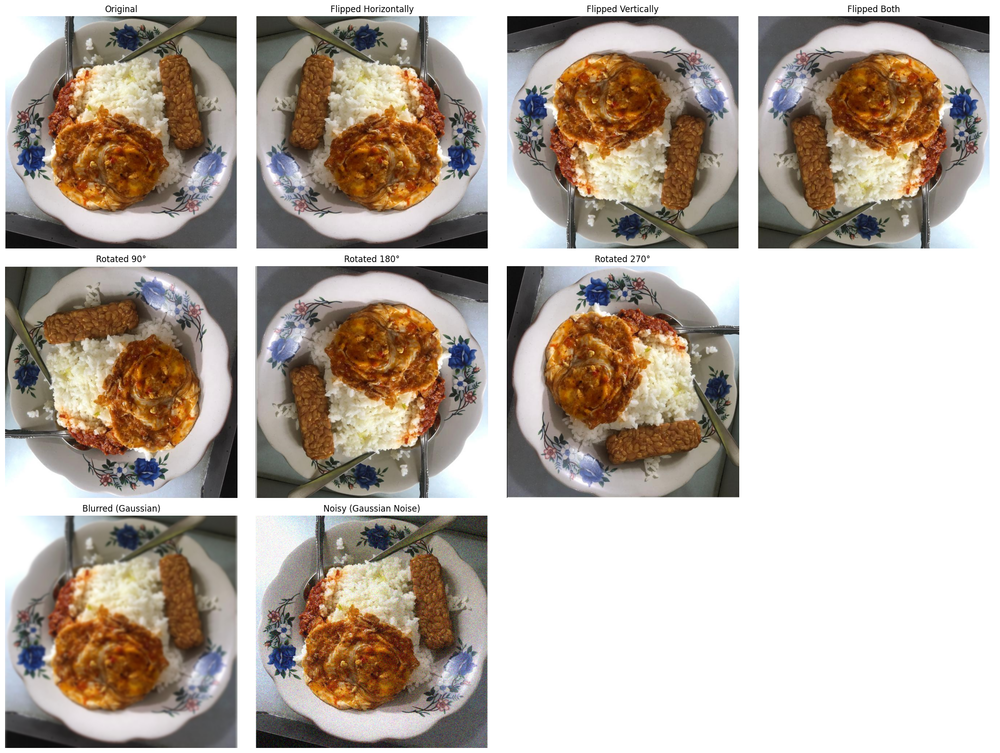

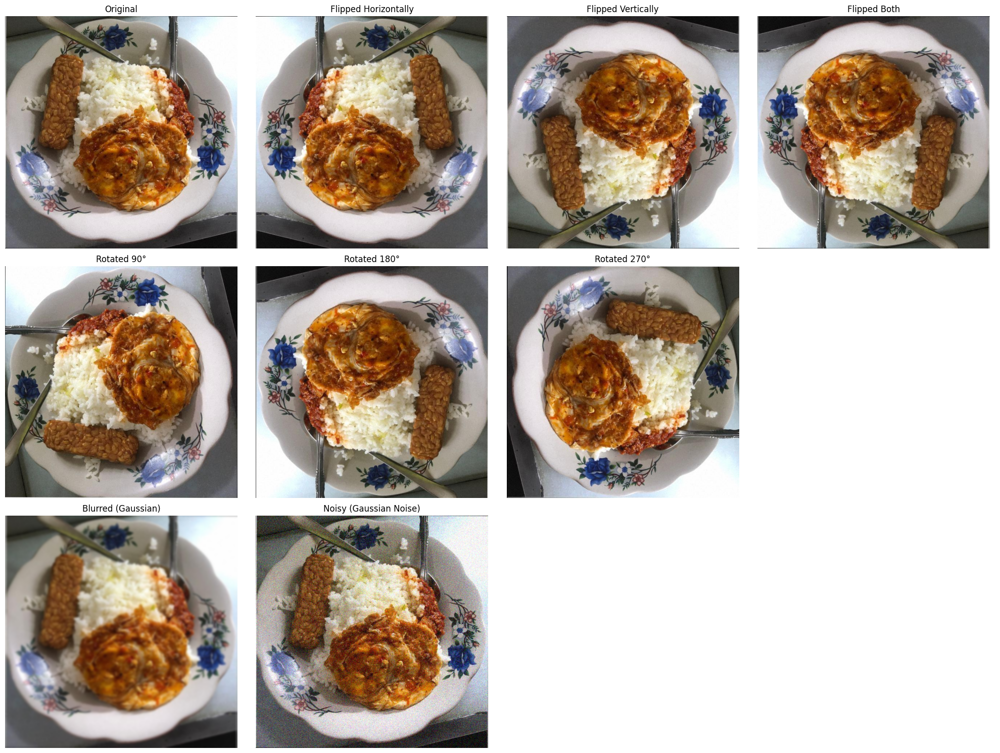

In [9]:
# Import necessary libraries
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Define the directory path
directory = 'dataset/train/images'

# List all files in the directory
files = os.listdir(directory)

# Select the first 5 image paths from the directory
image_paths = [os.path.join(directory, file) for file in files[:6]]

# Define a function to add Gaussian noise
def add_gaussian_noise(image, mean=0, sigma=25):
    row, col, ch = image.shape
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisy = np.clip(image + gauss, 0, 255).astype(np.uint8)
    return noisy

# Define a function to load and plot transformed images
def plotTransformedImages(image_paths):
    for img_path in image_paths[:2]:  # Limit to 2 images
        # Load image using cv2
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB (opencv uses BGR by default)

        # Generate flipped versions of the image
        flipped_horizontally = cv2.flip(img, 1)  # Flip horizontally
        flipped_vertically = cv2.flip(img, 0)    # Flip vertically
        flipped_both = cv2.flip(img, -1)        # Flip both horizontally and vertically

        # Generate rotated versions of the image
        height, width = img.shape[:2]
        center = (width // 2, height // 2)
        rotation_90 = cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 90, 1.0), (width, height))
        rotation_180 = cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 180, 1.0), (width, height))
        rotation_270 = cv2.warpAffine(img, cv2.getRotationMatrix2D(center, 270, 1.0), (width, height))

        # Apply blur and noise
        blurred_image = cv2.GaussianBlur(img, (15, 15), 0)  # Gaussian Blur
        noisy_image = add_gaussian_noise(img)  # Add Gaussian Noise

        # Plot the images
        fig, axes = plt.subplots(3, 4, figsize=(20, 15))
        
        # Original and flipped images
        axes[0][0].imshow(img)
        axes[0][0].set_title('Original')
        axes[0][0].axis('off')

        axes[0][1].imshow(flipped_horizontally)
        axes[0][1].set_title('Flipped Horizontally')
        axes[0][1].axis('off')

        axes[0][2].imshow(flipped_vertically)
        axes[0][2].set_title('Flipped Vertically')
        axes[0][2].axis('off')

        axes[0][3].imshow(flipped_both)
        axes[0][3].set_title('Flipped Both')
        axes[0][3].axis('off')

        # Rotated images
        axes[1][0].imshow(rotation_90)
        axes[1][0].set_title('Rotated 90°')
        axes[1][0].axis('off')

        axes[1][1].imshow(rotation_180)
        axes[1][1].set_title('Rotated 180°')
        axes[1][1].axis('off')

        axes[1][2].imshow(rotation_270)
        axes[1][2].set_title('Rotated 270°')
        axes[1][2].axis('off')

        axes[1][3].axis('off')  # Empty subplot for alignment

        # Blurred and noisy images
        axes[2][0].imshow(blurred_image)
        axes[2][0].set_title('Blurred (Gaussian)')
        axes[2][0].axis('off')

        axes[2][1].imshow(noisy_image)
        axes[2][1].set_title('Noisy (Gaussian Noise)')
        axes[2][1].axis('off')

        # Empty plots for alignment
        axes[2][2].axis('off')
        axes[2][3].axis('off')

        plt.tight_layout()
        plt.show()

# Call the function to display original, flipped, rotated, blurred, and noisy images
plotTransformedImages(image_paths)
